In [7]:
%load_ext autoreload
%autoreload 2
    
import os, sys

sys.path.insert(0, "../")
print(sys.path)
#otherwise leidenalg is used in an outdated version ...

import networkx as nx
import leidenalg as la
print("la", la.version)

%autoreload 2
from PICASO.kgraph import *
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from collections import defaultdict, Counter

import random
random.seed(42)

import pickle

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
['../', '../', '', '/opt/jhub/lib/python3.11/site-packages', '/opt/jhub/lib64/python3.11/site-packages', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python311.zip', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/lib-dynload', '/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages', '/opt/jhub/lib/python3.11/site-packages/setuptools/_vendor']
la 0.10.2


In [2]:
kg = KGraph()
kg.load_kgraph("../data/initial_base_graph.out")

In [3]:
exprKGs = None
exprKGs = pickle.load(open("ctcond_exprkgs.pickle", "rb"))

In [4]:
#'ATL_AKI', 'ATL_COV_AKI', 'ATL_DKD', 'ATL_H_CKD', 'ATL_Ref', 'CNT_AKI'
tissue2zone2kg = defaultdict(lambda : dict())
for x in exprKGs:
    celltype, condition = x.split("_",1)
    
    tissue2zone2kg[celltype]["{}_{}".format(celltype, condition)] = exprKGs[x]

In [5]:
for x in tissue2zone2kg:
    print(x, len(tissue2zone2kg[x]), [x for x in tissue2zone2kg[x]])

ATL 5 ['ATL_AKI', 'ATL_COV_AKI', 'ATL_DKD', 'ATL_H_CKD', 'ATL_Ref']
CNT 5 ['CNT_AKI', 'CNT_COV_AKI', 'CNT_DKD', 'CNT_H_CKD', 'CNT_Ref']
DCT 5 ['DCT_AKI', 'DCT_COV_AKI', 'DCT_DKD', 'DCT_H_CKD', 'DCT_Ref']
DTL 5 ['DTL_AKI', 'DTL_COV_AKI', 'DTL_DKD', 'DTL_H_CKD', 'DTL_Ref']
EC 5 ['EC_AKI', 'EC_COV_AKI', 'EC_DKD', 'EC_H_CKD', 'EC_Ref']
FIB 5 ['FIB_AKI', 'FIB_COV_AKI', 'FIB_DKD', 'FIB_H_CKD', 'FIB_Ref']
IC 5 ['IC_AKI', 'IC_COV_AKI', 'IC_DKD', 'IC_H_CKD', 'IC_Ref']
IMM 5 ['IMM_AKI', 'IMM_COV_AKI', 'IMM_DKD', 'IMM_H_CKD', 'IMM_Ref']
NEU 5 ['NEU_AKI', 'NEU_COV_AKI', 'NEU_DKD', 'NEU_H_CKD', 'NEU_Ref']
PC 5 ['PC_AKI', 'PC_COV_AKI', 'PC_DKD', 'PC_H_CKD', 'PC_Ref']
PEC 5 ['PEC_AKI', 'PEC_COV_AKI', 'PEC_DKD', 'PEC_H_CKD', 'PEC_Ref']
POD 5 ['POD_AKI', 'POD_COV_AKI', 'POD_DKD', 'POD_H_CKD', 'POD_Ref']
PT 5 ['PT_AKI', 'PT_COV_AKI', 'PT_DKD', 'PT_H_CKD', 'PT_Ref']
PapE 5 ['PapE_AKI', 'PapE_COV_AKI', 'PapE_DKD', 'PapE_H_CKD', 'PapE_Ref']
TAL 5 ['TAL_AKI', 'TAL_COV_AKI', 'TAL_DKD', 'TAL_H_CKD', 'TAL_Ref'

In [6]:
renameClass = "VSM/P"
renameElems = tissue2zone2kg[renameClass]

newclass = renameClass.replace("/", "-")

tissue2zone2kg[newclass] = dict()
for x in renameElems:
    newElem = x.replace("/", "-")
    tissue2zone2kg[newclass][newElem] = renameElems[x]


if renameClass in tissue2zone2kg:
    del tissue2zone2kg[renameClass]

for x in tissue2zone2kg:
    print(x, len(tissue2zone2kg[x]), [x for x in tissue2zone2kg[x]])

ATL 5 ['ATL_AKI', 'ATL_COV_AKI', 'ATL_DKD', 'ATL_H_CKD', 'ATL_Ref']
CNT 5 ['CNT_AKI', 'CNT_COV_AKI', 'CNT_DKD', 'CNT_H_CKD', 'CNT_Ref']
DCT 5 ['DCT_AKI', 'DCT_COV_AKI', 'DCT_DKD', 'DCT_H_CKD', 'DCT_Ref']
DTL 5 ['DTL_AKI', 'DTL_COV_AKI', 'DTL_DKD', 'DTL_H_CKD', 'DTL_Ref']
EC 5 ['EC_AKI', 'EC_COV_AKI', 'EC_DKD', 'EC_H_CKD', 'EC_Ref']
FIB 5 ['FIB_AKI', 'FIB_COV_AKI', 'FIB_DKD', 'FIB_H_CKD', 'FIB_Ref']
IC 5 ['IC_AKI', 'IC_COV_AKI', 'IC_DKD', 'IC_H_CKD', 'IC_Ref']
IMM 5 ['IMM_AKI', 'IMM_COV_AKI', 'IMM_DKD', 'IMM_H_CKD', 'IMM_Ref']
NEU 5 ['NEU_AKI', 'NEU_COV_AKI', 'NEU_DKD', 'NEU_H_CKD', 'NEU_Ref']
PC 5 ['PC_AKI', 'PC_COV_AKI', 'PC_DKD', 'PC_H_CKD', 'PC_Ref']
PEC 5 ['PEC_AKI', 'PEC_COV_AKI', 'PEC_DKD', 'PEC_H_CKD', 'PEC_Ref']
POD 5 ['POD_AKI', 'POD_COV_AKI', 'POD_DKD', 'POD_H_CKD', 'POD_Ref']
PT 5 ['PT_AKI', 'PT_COV_AKI', 'PT_DKD', 'PT_H_CKD', 'PT_Ref']
PapE 5 ['PapE_AKI', 'PapE_COV_AKI', 'PapE_DKD', 'PapE_H_CKD', 'PapE_Ref']
TAL 5 ['TAL_AKI', 'TAL_COV_AKI', 'TAL_DKD', 'TAL_H_CKD', 'TAL_Ref'

In [7]:
tissue2zone2kg["FIB"]

{'FIB_AKI': KGraph KGraph with 111032 nodes and 1617389 edges,
 'FIB_COV_AKI': KGraph KGraph with 111032 nodes and 1617389 edges,
 'FIB_DKD': KGraph KGraph with 111032 nodes and 1617389 edges,
 'FIB_H_CKD': KGraph KGraph with 111032 nodes and 1617389 edges,
 'FIB_Ref': KGraph KGraph with 111032 nodes and 1617389 edges}

In [8]:
short_t2z2k = {}
short_t2z2k["FIB"] = tissue2zone2kg["FIB"]
short_t2z2k["EC"] = tissue2zone2kg["EC"]

with open("short_t2z2k.pickle", 'wb') as f:    
    pickle.dump(short_t2z2k, f)

In [9]:
kg = KGraph()
kg.load_kgraph("../data/initial_base_graph.out")

with open("short_t2z2k.pickle", 'rb') as f:    
    short_t2z2k = pickle.load(f)

In [9]:
zoneSort = {
        "Ref": 0,
        "AKI": 1,
        "COV_AKI": 2,
        "DKD": 3,
        "H_CKD": 4
    }

In [10]:
tlda = TwoLevelDifferentialAnalysis(tissue2zone2kg, [x for x in zoneSort], output_folder_formatter="diff_{}/", fullKG=kg)

In [11]:
tlda.calculate_modules(relevant_cellgroups=None)

ATL


/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scipy/stats/_stats_py.py:6556: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1113: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/si

{'ATL_AKI': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'ATL_COV_AKI': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'ATL_DKD': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges, 'ATL_H_CKD': KGraph KGraph_vs_KGraph with 111032 nodes and 1617389 edges}
Analysing ATL_AKI
Identified communities
Number of communities: 258
Average community size 35.33720930232558
Median community size 28.5
Quantile (0,0.25,0.5,0.75,1) community size [  2.   18.   28.5  43.  212. ]
Significant communities
Number of communities: 194
Average community size 38.65979381443299
Median community size 31.0
Quantile (0,0.25,0.5,0.75,1) community size [ 10.  20.  31.  47. 212.]
ATL_AKI_mod_229 11
ATL_AKI_mod_127 20
ATL_AKI_mod_208 17
ATL_AKI_mod_110 21
ATL_AKI_mod_152 47
ATL_AKI_mod_48 29
ATL_AKI_mod_133 16
ATL_AKI_mod_179 18
ATL_AKI_mod_15 55
ATL_AKI_mod_5 157
ATL_AKI_mod_33 15
ATL_AKI_mod_126 10
ATL_AKI_mod_186 69
ATL_AKI_mod_134 88
ATL_AKI_mod_78 32
ATL_AKI_mod_221 24
ATL_

In [12]:
[(x, type(tlda.__dict__[x])) for x in tlda.__dict__]

[('tldict', dict),
 ('sorted_zones', list),
 ('name_sep', str),
 ('cellgroupdata', mikg.kgraph.DefaultDict),
 ('fullKG', mikg.kgraph.KGraph),
 ('output_folder_formatter', str),
 ('recalc_warning', bool)]

In [13]:
with open("kpmp_tlda.pickle", 'wb') as f:    
    pickle.dump(tlda, f)

In [3]:
import pickle
with open("kpmp_tlda.pickle", 'rb') as f:    
    tlda = pickle.load(f)

In [4]:
tlda

In [8]:
tlda.plot_module_comparisons(plot_communities=False)

Output directory diff_ATL/
diff_ATL//all_module_heatmap.png
diff_ATL//all_module_compare.png
diff_ATL//score_distribution.png
Output directory diff_CNT/
diff_CNT//all_module_heatmap.png
diff_CNT//all_module_compare.png
diff_CNT//score_distribution.png
Output directory diff_DCT/
diff_DCT//all_module_heatmap.png
diff_DCT//all_module_compare.png
diff_DCT//score_distribution.png
Output directory diff_DTL/
diff_DTL//all_module_heatmap.png
diff_DTL//all_module_compare.png
diff_DTL//score_distribution.png
Output directory diff_EC/
diff_EC//all_module_heatmap.png
diff_EC//all_module_compare.png
diff_EC//score_distribution.png
Output directory diff_FIB/
diff_FIB//all_module_heatmap.png
diff_FIB//all_module_compare.png
diff_FIB//score_distribution.png
Output directory diff_IC/
diff_IC//all_module_heatmap.png
diff_IC//all_module_compare.png
diff_IC//score_distribution.png
Output directory diff_IMM/
diff_IMM//all_module_heatmap.png
diff_IMM//all_module_compare.png
diff_IMM//score_distribution.png


In [18]:
ct=CommunityTool()
ct.compare_modules(tlda.communities, figsize=(75,75))

In [7]:
descrDF = tlda.describe_modules()
descrDF.to_csv("diff_modules_description.tsv", sep="\t")
descrDF

/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,COV_AKI_score_median,COV_AKI_score_mean,...,AKI_absmean-disease,AKI_absmean-drug,AKI_diffmean-gene,AKI_diffmean-disease,AKI_diffmean-drug,base_condition,base_zone,base_condition_score_mean,base_condition_score_median,cellgroup
0,ATL_AKI_mod_152,"[AFAP1L1, ANKLE2, ARHGAP39, ATE1, ATM, ATP10A,...",[],"[(Orphanet:98688, Oculomotor apraxia or relate...",[],[],"[TIGD4, ZBTB44, ZNF180, ZNF428, ZSCAN22]",{},-1.271686,-1.170504,...,0.625000,NaN,0.766226,0.242436,NaN,ATL_AKI,AKI,1.138040,0.959128,ATL
1,ATL_AKI_mod_179,"[GPAA1, MIEN1, MIS12, PGAP2, PGAP3, PIGA, PIGF...","[(GO:0016254, preassembly of GPI anchor in ER ...",[],[],[],[],{},-0.194393,-0.384939,...,NaN,NaN,0.618139,NaN,NaN,ATL_AKI,AKI,1.081111,0.998651,ATL
2,ATL_AKI_mod_33,"[INTS1, INTS10, INTS12, INTS2, INTS3, INTS4, I...","[(GO:0016180, snRNA processing), (GO:0032039, ...",[],[],[],[ZNF609],{},-1.213416,-1.125034,...,NaN,NaN,0.458746,NaN,NaN,ATL_AKI,AKI,0.869389,0.831690,ATL
3,ATL_AKI_mod_186,"[ADCK1, AKAP10, ANKRD27, APPL2, ARL1, CCZ1B, C...",[(KEGG_MEDICUS_REFERENCE_EARLY_ENDOSOMAL_FUSIO...,[],[],"[mir-211, mir-338]","[EEA1, SGSM2]",{},-0.236979,-0.288106,...,NaN,NaN,0.432838,NaN,NaN,ATL_AKI,AKI,0.801803,0.710738,ATL
4,ATL_AKI_mod_78,"[CCP110, CEP104, CEP120, CEP135, CEP152, CEP19...","[(R-HSA-5624958, ARL13B-mediated ciliary traff...",[],[],[],[RARB],{},-0.490829,-0.409524,...,NaN,NaN,0.482350,NaN,NaN,ATL_AKI,AKI,0.813355,0.784658,ATL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1376,VSM-P_COV_AKI_mod_185,"[ALDH1L1, ALDH1L2, ATIC, CBR1, DHFR, DHPS, FPG...","[(GO:0004505, phenylalanine 4-monooxygenase ac...",[],[],"[mir-141, mir-192, mir-193b, mir-215, mir-24, ...",[TFDP2],{},0.289290,0.612162,...,NaN,NaN,-0.163368,NaN,NaN,VSM-P_COV_AKI,COV_AKI,0.612162,0.289290,VSM-P
1377,VSM-P_COV_AKI_mod_154,"[AHCYL1, AHCYL2, BHMT, BHMT2, CA12, CA2, CA4, ...",[],"[(EFO:1002002, high altitude pulmonary edema)]","[(CHEMBL95889, BETAINE)]","[mir-1, mir-185]","[HOXB13, KAT7]",{},0.666520,0.969040,...,0.097222,0.156935,-0.075041,0.064819,-0.284978,VSM-P_COV_AKI,COV_AKI,0.969040,0.666520,VSM-P
1378,VSM-P_COV_AKI_mod_82,"[A2M, ADAM7, ADM, APOH, BET1, C1QB, C1R, C1RL,...",[(KEGG_MEDICUS_REFERENCE_REGULATION_OF_FIBRINO...,"[(Orphanet:91378, Hereditary angioedema)]","[(CHEMBL2109065, DROTRECOGIN ALFA (ACTIVATED))...","[mir-124, mir-125a, mir-1291, mir-139, mir-192...","[FOSL2, HNF4G]",{},0.348539,0.638841,...,0.059163,0.107618,-0.081058,0.135694,-0.137909,VSM-P_COV_AKI,COV_AKI,0.638841,0.348539,VSM-P
1379,VSM-P_COV_AKI_mod_67,"[AMBRA1, AMOTL2, ATG10, ATG101, ATG12, ATG13, ...","[(GO:1903059, regulation of protein lipidation...",[],[],"[BANCR, FLJ11812, mir-1226, mir-137, mir-192, ...","[TBP, TFEB]",{},0.274397,0.146005,...,NaN,NaN,-0.226934,NaN,NaN,VSM-P_COV_AKI,COV_AKI,0.146005,0.274397,VSM-P


In [20]:
geneset_overlapDF = tlda.create_overlap_df("geneset")
geneset_overlapDF.head()

27643


,celltype,module,geneset,geneset_size,geneset_name,overlap,jaccard
0,ATL,ATL_AKI_mod_152,GO:0000049,75,tRNA binding,0.026667,0.016667
1,ATL,ATL_AKI_mod_152,GO:0000077,35,DNA damage checkpoint signaling,0.028571,0.012346
2,ATL,ATL_AKI_mod_152,GO:0000120,1,RNA polymerase I transcription regulator complex,1.000000,0.021277
3,ATL,ATL_AKI_mod_152,GO:0000122,949,negative regulation of transcription by RNA po...,0.002107,0.002012
4,ATL,ATL_AKI_mod_152,GO:0000150,2,DNA strand exchange activity,0.500000,0.020833


In [21]:
disease_overlapDF = tlda.create_overlap_df("disease")
disease_overlapDF.head()

7184


,celltype,module,disease,disease_size,disease_name,overlap,jaccard
0,ATL,ATL_AKI_mod_152,GO:0051726,223,regulation of cell cycle,0.008969,0.007463
1,ATL,ATL_AKI_mod_152,EFO:0000305,155,breast carcinoma,0.006452,0.004975
2,ATL,ATL_AKI_mod_152,EFO:0000616,159,neoplasm,0.006289,0.004878
3,ATL,ATL_AKI_mod_152,EFO:0000673,104,prostate adenocarcinoma,0.009615,0.006667
4,ATL,ATL_AKI_mod_152,EFO:0000365,198,colorectal adenocarcinoma,0.005051,0.004098


In [22]:
drug_overlapDF = tlda.create_overlap_df("drug")
drug_overlapDF.head()

3195


,celltype,module,drug,drug_size,drug_name,overlap,jaccard
0,ATL,ATL_AKI_mod_78,CHEMBL628,25,PENTOXIFYLLINE,0.040000,0.017857
1,ATL,ATL_AKI_mod_78,CHEMBL38,3,TRETINOIN,0.333333,0.029412
2,ATL,ATL_AKI_mod_78,CHEMBL25202,2,TAMIBAROTENE,0.500000,0.030303
3,ATL,ATL_AKI_mod_78,CHEMBL932,24,DIPYRIDAMOLE,0.041667,0.018182
4,ATL,ATL_AKI_mod_78,CHEMBL547,3,ISOTRETINOIN,0.333333,0.029412


In [43]:
geneset_overlapDF.to_csv("diff_modules_description_overlap_geneset.tsv", sep="\t")
disease_overlapDF.to_csv("diff_modules_description_overlap_disease.tsv", sep="\t")
drug_overlapDF.to_csv("diff_modules_description_overlap_drug.tsv", sep="\t")


In [10]:
import scanpy as sc

adata = sc.read_h5ad("kpmp.h5ad")
celltype_col="subclass.l1"
condition_col = "myconditions"

adata.obs[condition_col] = pd.Categorical(adata.obs[condition_col], ordered=True, categories=[x for x in zoneSort])

adata.obs["ct_condition"] = adata.obs[celltype_col].astype(str) + "_" + adata.obs[condition_col].astype(str)
adata.obs["ct_condition"] = pd.Categorical(adata.obs["ct_condition"])
adata

AnnData object with n_obs × n_vars = 200338 × 33826
    obs: 'nCount_RNA', 'nFeature_RNA', 'mypatients', 'percent.er', 'percent.mt', 'degen.score', 'aEpi.score', 'aStr.score', 'cyc.score', 'matrisome.score', 'collagen.score', 'glycoprotein.score', 'proteoglycan.score', 'S.Score', 'G2M.Score', 'experiment', 'specimen', 'condition.long', 'condition.l1', 'myconditions', 'donor_id', 'region.l1', 'region.l2', 'percent.cortex', 'percent.medulla', 'sample_tissue_type', 'id', 'pagoda_k100_infomap_coembed', 'subclass.full', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'state.l2', 'state', 'class', 'structure', 'disease_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'eGFR', 'BMI', 'diabetes_history', 'hypertension', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'is_primary_data', 'suspension_type', 'tissue_type', 'mycelltypes', 'assay', 'disease', 'organ

In [25]:
#tlda.describe_module_scrna(adata, celltype_col, condition_col, show_plot=False, plot_folder="module_plots")

In [26]:
rel_modules = descrDF[descrDF.drug_nodes.apply(len) != 0].sort_values(["base_condition", "base_condition_score_mean"], ascending=[True, False]).groupby(['base_condition']).head(3)
rel_modules

,name,gene_nodes,geneset_nodes,disease_nodes,drug_nodes,ncRNA_nodes,TF_nodes,other_nodes,COV_AKI_score_median,COV_AKI_score_mean,...,AKI_absmean-gene,AKI_absmean-disease,AKI_absmean-drug,AKI_diffmean-gene,AKI_diffmean-disease,AKI_diffmean-drug,base_condition,base_zone,base_condition_score_mean,base_condition_score_median
83,ATL_AKI_mod_37,"[ABL1, AFDN, APH1A, APH1B, ARF6, ARHGEF15, ASC...","[(GO:0005003, ephrin receptor activity), (GO:0...",[],"[(CHEMBL24828, VANDETANIB)]","[mir-21, mir-449a]","[ASCL1, ELF2]",{},-0.604414,-0.846367,...,0.423759,NaN,0.391197,0.362707,NaN,-0.038987,ATL_AKI,AKI,1.017571,0.987462
21,ATL_AKI_mod_49,"[C17orf75, CYP46A1, DHCR24, DHCR7, EBP, EMD, F...","[(GO:0033489, cholesterol biosynthetic process...",[],"[(CHEMBL400599, BENFLUOREX)]",[],"[FOXJ2, ZNF207]",{},-0.462747,-0.552465,...,0.358073,NaN,0.336312,0.625048,NaN,0.310935,ATL_AKI,AKI,0.955707,0.868438
40,ATL_AKI_mod_135,"[ARL15, ASCC1, BRD9, CDAN1, DLD, EEF1D, HACD1,...","[(GO:0004739, pyruvate dehydrogenase (acetyl-t...","[(Orphanet:765, Pyruvate dehydrogenase deficie...","[(CHEMBL306823, SODIUM DICHLOROACETATE)]",[mir-188],"[HIC2, PPARD]",{},-0.633255,-0.835087,...,0.425000,0.341667,0.252376,0.440530,1.049338,-0.247618,ATL_AKI,AKI,0.904060,0.967565
103,ATL_COV_AKI_mod_131,"[AFDN, CD226, IGHM, NECTIN1, NECTIN2, NECTIN3,...","[(R-HSA-420597, Nectin/Necl trans heterodimer...",[],"[(CHEMBL3301589, ENFORTUMAB VEDOTIN)]",[],[],{},1.051280,1.061415,...,1.024306,NaN,0.229776,0.125230,NaN,-0.007867,ATL_COV_AKI,COV_AKI,1.061415,1.051280
108,ATL_COV_AKI_mod_200,"[ARNT, CRK, CTNNA1, CTNND1, CTSB, IGF1, IGFBP5...","[(GO:0016942, insulin-like growth factor bindi...",[],"[(CHEMBL2109355, DUSIGITUMAB)]","[mir-101, mir-107, mir-124, mir-125b, mir-126,...",[ARNT],{},0.687709,0.556524,...,1.151042,NaN,0.177852,-0.624171,NaN,-0.106152,ATL_COV_AKI,COV_AKI,0.556524,0.687709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1326,TAL_COV_AKI_mod_117,"[ABCA2, ABCC2, ABCD4, AKR1A1, AKR1C3, AKR7A2, ...","[(GO:0004505, phenylalanine 4-monooxygenase ac...",[],"[(CHEMBL1762621, BARDOXOLONE METHYL)]","[mir-130a, mir-218, mir-30b]",[NFE2L2],{},1.039465,1.120773,...,0.290721,NaN,0.668442,0.329237,NaN,-0.153278,TAL_COV_AKI,COV_AKI,1.120773,1.039465
1275,TAL_COV_AKI_mod_144,"[ARHGEF28, KCND1, KCNIP2, KCNIP4, MAP2K4, MAP2...","[(GO:0055106, ubiquitin-protein transferase re...",[],"[(CHEMBL290352, CEP-1347), (CHEMBL3137331, DEF...",[mir-31],[MLXIPL],{},0.901856,0.994646,...,1.738934,NaN,0.500149,0.111849,NaN,-0.141042,TAL_COV_AKI,COV_AKI,0.994646,0.901856
1348,VSM-P_COV_AKI_mod_193,"[ABCG1, ACAT2, ADCY10, AFM, APOA1, APOC3, ATF1...","[(GO:0015747, urate transport), (GO:0097744, r...","[(EFO:0004742, renal system measurement), (EFO...","[(CHEMBL4297938, LIFASTUZUMAB VEDOTIN), (CHEMB...","[mir-122, mir-192]","[ATF1, HNF1A, HNF1B, NFIC, ZNF202]",{},1.489556,1.555822,...,0.172488,0.260382,0.084732,0.297555,0.795930,-0.141913,VSM-P_COV_AKI,COV_AKI,1.555822,1.489556
1355,VSM-P_COV_AKI_mod_76,"[ACP3, ALDH1A1, ALDH1A2, ALDH1A3, CD24, CD44, ...","[(GO:2000768, positive regulation of nephron t...",[],"[(CHEMBL3545262, SACITUZUMAB GOVITECAN)]","[mir-124, mir-125a, mir-140, mir-92b]","[HOXC11, MBD2]",{},0.903777,1.002462,...,0.128199,NaN,0.169312,-0.118094,NaN,-0.788617,VSM-P_COV_AKI,COV_AKI,1.002462,0.903777


In [88]:
%%capture captured_describe_module

tlda.describe_module_scrna(adata, celltype_col, condition_col, module_names=list(rel_modules.name), show_plot=False, plot_folder="module_plots")

In [89]:
captured_describe_module()

disease 7184
geneset 27643
drug 3195
['FAS', 'PSEN1', 'EPHA7', 'TRHDE', 'ABL1', 'SDCBP', 'EPHA1', 'YES1', 'EFNB2', 'BLK', 'AFDN', 'PTPRO', 'EFNA1', 'RASA1', 'PGPEP1', 'EPHB4', 'EPHA5', 'CTNND1', 'EPHA4', 'PLCE1', 'MRAS', 'TMED10', 'UBE3A', 'EPHB6', 'NCSTN', 'EPHB3', 'NRAS', 'DNER', 'RRAS', 'MYL12A', 'DCBLD1', 'EPHB2', 'PSEN2', 'KALRN', 'EVC2', 'CTR9', 'APH1B', 'ASCL1', 'ARHGEF15', 'ARF6', 'NUDT4B', 'EFNA5', 'APH1A', 'DOK3', 'EFNB1', 'ELF2', 'DTX1', 'mir-449a', 'mir-21']
40
Saving plot for module ATL_AKI_mod_37 :  module_plots/overview_plot_ATL_AKI_mod_37.png
['SYNE4', 'MVP', 'LMNB2', 'SCGB1D2', 'DHCR7', 'TOR1AIP2', 'CYP46A1', 'SUN2', 'LEMD3', 'TJAP1', 'SYNE1', 'NPR3', 'TOR1A', 'ZNF207', 'LBR', 'LIPA', 'WDR11', 'C17orf75', 'MAJIN', 'TM7SF2', 'SC5D', 'VPS52', 'DHCR24', 'MSMO1', 'SOAT1', 'EBP', 'FAM91A1', 'EMD', 'FOXJ2', 'TOR1AIP1', 'LMNB1', 'SUN1']
40
Saving plot for module ATL_AKI_mod_49 :  module_plots/overview_plot_ATL_AKI_mod_49.png
['PDK1', 'ARL15', 'PDK3', 'PDHA1', 'PDHA2', 'PDPR',

/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3941: UserWarning: This figure includes Axes that are not compatible with t

In [15]:
spec_mods = descrDF[descrDF.name.str.startswith("EC_")].name
tlda.describe_module_scrna(adata, celltype_col, condition_col, module_names=list(spec_mods), show_plot=False, plot_folder="module_plots_spec")

disease 7184
geneset 27643
drug 3195
['SYNE4', 'CLCN4', 'IDH3A', 'PLEC', 'TAL1', 'ZPLD1', 'SYNE2', 'LMNA', 'CROCC', 'CEBPA', 'KIF3B', 'SYNE1', 'MUSK', 'OSGEP', 'RBMS2', 'TP73', 'S100Z', 'KIAA1217', 'EMCN', 'RBMS1', 'EMD', 'LMNB1', 'CLMN', 'FHOD1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_34 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_34.png
['H4C14', 'ANO6', 'ANO10', 'APOL4', 'TCF4', 'TNFRSF19', 'ABHD12B', 'LINC03040', 'LGR5', 'RHBG', 'CTXN1', 'BEST1', 'H4C2', 'C2CD4A', 'STAR', 'ANO9', 'RTN4', 'SECTM1', 'ACVR1C', 'DCXR', 'ANO1']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_183 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_183.png
['IFITM3', 'SAMHD1', 'HLA-A', 'OAS3', 'ZMPSTE24', 'BIRC2', 'VAMP3', 'IRF3', 'IFI44', 'IFI27L2', 'BST2', 'IFI44L', 'MX2', 'MAVS', 'PARP12', 'ISG20', 'IFIH1', 'HLA-E', 'OAS2', 'IP6K2', 'GBP1', 'OASL', 'SP110', 'IRF2', 'HLA-C', 'SAMD9L', 'IFI27L1', 'IFIT1', 'LAMTOR5', 'DDX60', 'TRIM25', 'ISG15', 'BIRC3', 'HERC6', 'IFIT2', 'RNASEL', 'MX1', 'IFITM2', 'HLA-F', 'HLA-B', 'IFIT5', 'ADAR', 'XAF1', 'KLRD1', 'IFI35', 'IL12B', 'VAPA', 'GBP2', 'IFI6', 'IFIT3', 'RSAD2', 'OAS1', 'IRF7', 'IFI27', 'mir-141', 'mir-203a', 'mir-34a', 'mir-16']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_71 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_71.png
['LHX1', 'SLC3A1', 'PAX8', 'NBN', 'GEN1', 'BEX1', 'WRN', 'CAMKMT', 'PPM1B', 'SSBP3', 'LDB2', 'BARD1', 'SSBP2', 'RAD51B', 'LMO2', 'MAP3K7', 'RBBP8']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_46 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_46.png
['MNX1', 'CUZD1', 'ADM2', 'HOXA3', 'GNG2', 'GAP43', 'HOXB3', 'CCDC28B', 'TRAF4', 'H2AC11', 'EMC9', 'TCF12', 'GIMAP4', 'TRIB2', 'MDP1', 'CALCR', 'CHI3L1', 'GIMAP8', 'AP1G2', 'GNB1', 'CALM1', 'LY86', 'DMRT2', 'RAMP3', 'VIPR1', 'PTMA', 'SCTR', 'TAC1', 'BSND', 'WASL', 'MZT2B', 'DMRT1', 'RUBCNL', 'LILRB1', 'VWDE', 'VGF', 'ATG5', 'LHX2', 'RAMP2', 'NXF3', 'GABRB3', 'HEPHL1', 'TBX5', 'GIMAP5', 'CALCB', 'ABHD11', 'CALCRL', 'UBALD2', 'mir-200a', 'mir-363', 'mir-206']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_74 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_74.png
['ARRB2', 'TLR2', 'FASN', 'CEACAM1', 'CXCL8', 'POLDIP2', 'NFKBIE', 'HAVCR2', 'PRKCD', 'ADRB2']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_148 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_148.png
['CALM3', 'SPTBN2', 'TRPV6', 'PDE3B', 'UNC13B', 'RIC1', 'RAC2', 'RAPGEF3', 'TBK1', 'PKIB', 'GRM7', 'KCNQ1', 'MYLK', 'AMPD3', 'MYO10', 'ELMO1', 'AK3', 'ATP2B4', 'ADK', 'DRD2', 'PDE1A', 'PDE3A', 'SLFN12', 'SCN8A', 'PDE1C', 'DOCK1', 'AKAP5', 'RAB3A', 'CAMP', 'mir-203a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_156 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_156.png
['ACSL4', 'RPS6KB1', 'HTATIP2', 'ACOX1', 'MRE11', 'EEF2K', 'ELOVL1', 'ACSM2A', 'HADHA', 'ACADS', 'RXRB', 'ACSL1', 'SH3GLB1', 'ACSM2B', 'ACADVL', 'ACSL3', 'ELOVL6', 'AMMECR1', 'mir-16', 'mir-200c', 'mir-34a']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_172 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_172.png
['RANBP10', 'TLN2', 'HDLBP', 'MAX', 'EHBP1', 'ANK2', 'EHD3', 'FDPS', 'VPS45', 'RAB11FIP2', 'PACSIN2', 'SERPINE1', 'MYOF', 'YY1', 'EPS15', 'EHD1', 'mir-122']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_3 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_3.png
['BTBD7', 'CLK2', 'FOXA1', 'MTA3', 'BRCA2', 'ZEB2', 'SNAI2', 'OXTR', 'TCF15', 'CLDN1', 'ESRP2', 'LPAR2', 'ITGB4', 'COL2A1', 'CXADR', 'CDH17', 'MEOX2', 'CAPN1', 'ARHGAP31', 'HPGD', 'MMP17', 'ACAN', 'ALPL', 'CLDN4', 'ZBTB17', 'PRSS8', 'mir-495', 'let-7b', 'mir-17', 'mir-1245a', 'mir-451a', 'mir-155', 'mir-29a', 'mir-143', 'mir-122', 'mir-21']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_108 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_108.png
['HAP1', 'GNB4', 'CACNA1C', 'CDK13', 'ATP1A1', 'GNG5', 'CDK17', 'PPP1R1B', 'RCAN2', 'PPP3CC', 'NOS1', 'PPP3CA', 'GUK1', 'MYL12A', 'KSR2', 'CACNA2D1', 'ZNF804A', 'KALRN', 'CATSPER2', 'GNG7', 'GNG11', 'RARB', 'CACNA1D', 'BIN1', 'PPP3CB', 'CACNB4', 'NOS1AP', 'CACNB2', 'PPP1CB', 'GNG10']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_114 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_114.png
['ESRRB', 'RIMKLB', 'DNASE1', 'BGLAP', 'ENO1', 'ATF6', 'PNRC2', 'MED13', 'AFMID', 'CDK19', 'SUZ12', 'WDR5', 'MED23', 'ESRRG', 'THRAP3', 'MED27', 'PPARGC1B', 'PCK1', 'CREBZF', 'NRIP1', 'MED4', 'ACADM', 'MED14', 'IBSP', 'CCNC', 'MED15', 'mir-125b', 'mir-199a', 'mir-424', 'mir-208a', 'mir-18a', 'HOTTIP', 'mir-205', 'mir-320a', 'mir-33b', 'mir-221']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_33 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_33.png
['FOXN3', 'KCNIP1', 'WEE1', 'KCND2', 'MEN1', 'STMN1', 'KCND3', 'KCND1', 'PAK1', 'KCNIP2', 'KCNIP4']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_120 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_120.png
['DTNBP1', 'CHD7', 'GRIN1', 'PSEN1', 'ERBB2', 'NRG3', 'ERBB3', 'PIK3C3', 'DOCK7', 'ATP2C1', 'AUTS2', 'ADAM17', 'PRKCB', 'NRAS', 'SORT1', 'ADGRL1', 'HRAS', 'NRG4', 'CADPS2', 'NRG2', 'NRG1', 'PAX2', 'CDC37', 'mir-193a', 'mir-21', 'mir-9', 'mir-96', 'mir-149', 'mir-122', 'mir-152', 'mir-26a', 'mir-184']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_COV_AKI_mod_29 :  module_plots_spec/overview_plot_EC_COV_AKI_mod_29.png
['WNK4', 'KCNJ10', 'MTOR', 'PRKAA1', 'KCNJ1', 'NFAT5', 'KCNJ16', 'ITSN1', 'SLC12A4', 'TRPC3', 'SLC12A1', 'SLC4A4', 'WNK3', 'SLC9A3', 'BSND', 'PDZK1', 'CLCNKB', 'CLCNKA', 'SGK3', 'AQP2', 'OXSR1', 'LTB', 'SLC4A2', 'KCNJ15']
40


/mnt/raidbio/extproj/projekte/regulatory_networks/kpmp/../mikg/kgraph.py:3987: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Saving plot for community EC_H_CKD_mod_14 :  module_plots_spec/overview_plot_EC_H_CKD_mod_14.png


In [18]:
xTotalCount = 0
for x in tlda.cellgroupdata:
    xcommcount = len(tlda.cellgroupdata[x]["communities"])
    print(x, xcommcount)
    xTotalCount += xcommcount

xTotalCount

ATL 109
CNT 155
DCT 148
DTL 148
EC 15
FIB 96
IC 74
IMM 32
NEU 130
PC 31
PEC 170
POD 47
PT 39
PapE 78
TAL 56
VSM-P 53


1381

In [16]:
aid = AIDescriptor()

In [17]:
spec_mods

560     EC_COV_AKI_mod_34
561    EC_COV_AKI_mod_183
562     EC_COV_AKI_mod_71
563     EC_COV_AKI_mod_46
564     EC_COV_AKI_mod_74
565    EC_COV_AKI_mod_148
566    EC_COV_AKI_mod_156
567    EC_COV_AKI_mod_172
568      EC_COV_AKI_mod_3
569    EC_COV_AKI_mod_108
570    EC_COV_AKI_mod_114
571     EC_COV_AKI_mod_33
572    EC_COV_AKI_mod_120
573     EC_COV_AKI_mod_29
574       EC_H_CKD_mod_14
Name: name, dtype: object

EC_COV_AKI_mod_34
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: KIAA1217, ZPLD1, S100Z, PLEC, IDH3A, TAL1, CEBPA, EMD, SYNE2, RBMS2, CLCN4, TP73, FHOD1, OSGEP, CLMN, LMNB1, EMCN, RBMS1, MUSK, LMNA, SYNE1, SYNE4, CROCC, KIF3B. How are these genes connected and which molecular functions are altered?

Do not repeat functions of single genes.

Only return the helpful answer. Answer must be concise, detailed and well explained.
Helpful answer:
        


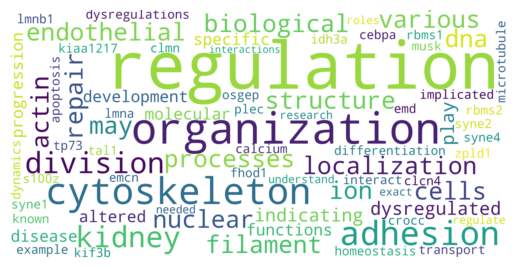

These genes are dysregulated in endothelial cells in kidney, indicating that they may play a role in the development or progression of kidney disease. The specific molecular functions altered by these gene dysregulations are not known, but some of them have been implicated in various biological processes such as cell adhesion, cytoskeleton organization, and DNA repair. For example, KIAA1217 is involved in the regulation of actin filament organization, while ZPLD1 is involved in the regulation of cell adhesion. S100Z is involved in the regulation of calcium ion homeostasis, while PLEC is involved in the regulation of cytoskeleton organization. IDH3A is involved in the regulation of DNA repair, while TAL1 and CEBPA are involved in the regulation of cell differentiation. EMD is involved in the regulation of cell adhesion, while SYNE2 is involved in the regulation of cytoskeleton organization. RBMS2 is involved in the regulation of cell division, while CLCN4 is involved in the regulation o

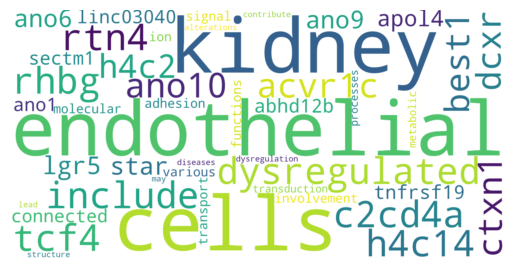

The dysregulated genes in endothelial cells in kidney include RHBG, RTN4, TCF4, C2CD4A, H4C14, ANO10, ACVR1C, BEST1, DCXR, CTXN1, H4C2, LGR5, STAR, ANO6, ANO9, APOL4, TNFRSF19, ABHD12B, LINC03040, SECTM1, and ANO1. These genes are connected through their involvement in various molecular functions such as cell adhesion, ion transport, signal transduction, and metabolic processes. The dysregulation of these genes may lead to alterations in the structure and function of endothelial cells, which can contribute to kidney diseases.

EC_COV_AKI_mod_71
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: RSAD2, OAS3, IFI6, SAMHD1, HERC6, MAVS, IRF2, DDX60, IFI44, IFIT5, ISG15, IFI44L, IFITM2, HLA-E, IFITM3, TRIM25, BIRC3, IP6K2, KLRD1, SP110, IFI27L2, ISG20, IL12B, BIRC2, GBP1, ADAR, IFI35, ZMPSTE24, IFIT3,

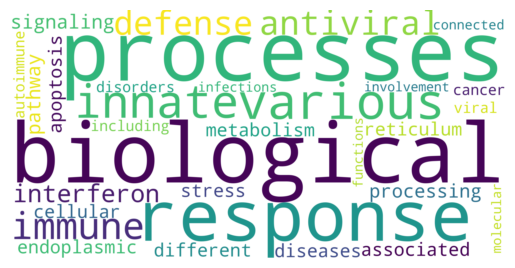

These genes are involved in various biological processes such as innate immune response, antiviral defense, interferon signaling pathway, protein processing, endoplasmic reticulum stress response, apoptosis, and cellular metabolism. They are also associated with different diseases including cancer, autoimmune disorders, and viral infections. The genes are connected through their involvement in the same biological processes and molecular functions.

EC_COV_AKI_mod_46
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: NBN, CAMKMT, PPM1B, BARD1, SLC3A1, WRN, RBBP8, BEX1, SSBP2, MAP3K7, PAX8, LDB2, RAD51B, GEN1, LHX1, LMO2, SSBP3. How are these genes connected and which molecular functions are altered?

Do not repeat functions of single genes.

Only return the helpful answer. Answer must be concise, d

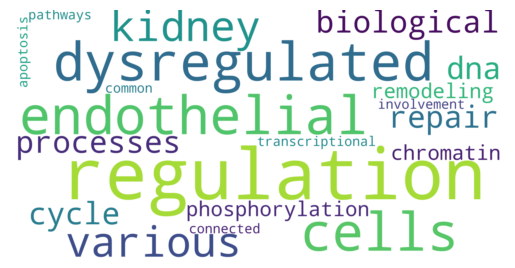

The dysregulated genes in endothelial cells in kidney are involved in various biological processes such as DNA repair, cell cycle regulation, protein phosphorylation, chromatin remodeling, transcriptional regulation, and apoptosis. These genes are connected through their involvement in these common pathways.

EC_COV_AKI_mod_74
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: SCTR, DMRT2, VIPR1, NXF3, H2AC11, GIMAP8, GIMAP4, GNG2, LILRB1, TRIB2, DMRT1, CUZD1, ADM2, GNB1, VWDE, RAMP2, WASL, ABHD11, HOXA3, AP1G2, MDP1, CALCR, CALM1, TAC1, VGF, GIMAP5, HOXB3, BSND, MZT2B, TCF12, LHX2, TBX5, GABRB3, LY86, RUBCNL, RAMP3, UBALD2, ATG5, CHI3L1, MNX1, CCDC28B, CALCRL, EMC9, GAP43, CALCB, PTMA, TRAF4, HEPHL1. How are these genes connected and which molecular functions are altered?

Do not repeat functions

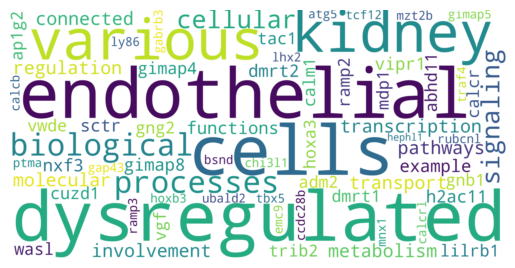

The dysregulated genes in endothelial cells in kidney are involved in various biological processes such as cellular signaling, transcription regulation, protein transport, and metabolism. These genes are connected through their involvement in the same pathways or molecular functions. For example, SCTR, DMRT2, VIPR1, NXF3, H2AC11, GIMAP8, GIMAP4, GNG2, LILRB1, TRIB2, DMRT1, CUZD1, ADM2, GNB1, VWDE, RAMP2, WASL, ABHD11, HOXA3, AP1G2, MDP1, CALCR, CALM1, TAC1, VGF, GIMAP5, HOXB3, BSND, MZT2B, TCF12, LHX2, TBX5, GABRB3, LY86, RUBCNL, RAMP3, UBALD2, ATG5, CHI3L1, MNX1, CCDC28B, CALCRL, EMC9, GAP43, CALCB, PTMA, TRAF4, HEPHL1.

EC_COV_AKI_mod_148
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: ADRB2, HAVCR2, ARRB2, CEACAM1, NFKBIE, PRKCD, TLR2, FASN, CXCL8, POLDIP2. How are these genes connected and 

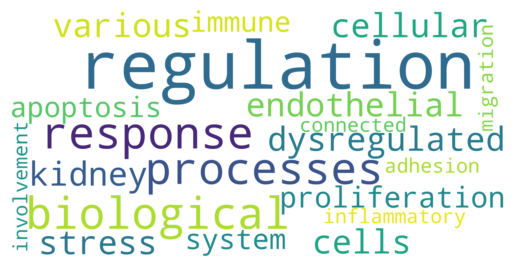

The dysregulated genes in endothelial cells in kidney are involved in various biological processes such as regulation of cellular response to stress, regulation of cell proliferation, regulation of apoptosis, regulation of immune system, regulation of inflammatory response, regulation of cell adhesion and migration. These genes are connected through their involvement in these biological processes.

EC_COV_AKI_mod_156
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: ELMO1, RAPGEF3, AKAP5, SCN8A, CAMP, RAB3A, TRPV6, CALM3, AK3, MYO10, ADK, SPTBN2, AMPD3, MYLK, DRD2, KCNQ1, PDE3B, PDE1A, TBK1, RIC1, UNC13B, PDE1C, DOCK1, RAC2, PKIB, SLFN12, ATP2B4, GRM7, PDE3A. How are these genes connected and which molecular functions are altered?

Do not repeat functions of single genes.

Only return the helpful

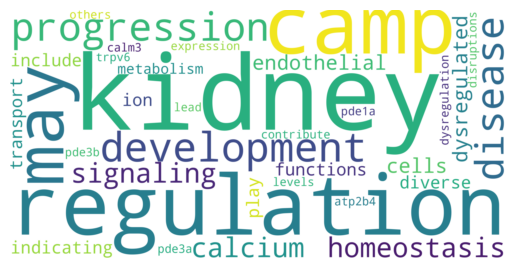

These genes are dysregulated in endothelial cells in kidney, indicating that they may play a role in the development or progression of kidney disease. The functions of these genes are diverse and include regulation of cell signaling, ion transport, metabolism, and gene expression. Some of the genes are involved in the regulation of calcium homeostasis, such as TRPV6, ATP2B4, and CALM3. Others are involved in the regulation of cAMP levels, such as CAMP, PDE1A, PDE3A, and PDE3B. The dysregulation of these genes may lead to disruptions in calcium homeostasis and cAMP signaling, which can contribute to the development or progression of kidney disease.

EC_COV_AKI_mod_172
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: ACSL3, ACOX1, HTATIP2, RPS6KB1, ACADS, RXRB, ACSL1, ACSM2B, ELOVL6, ACSL4, ACSM2A

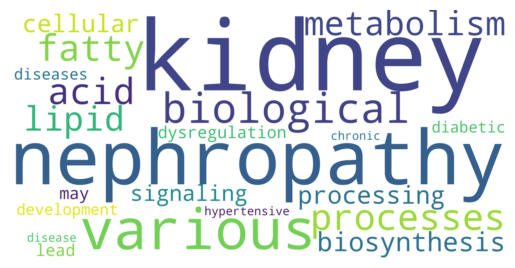

These genes are involved in various biological processes such as fatty acid metabolism, lipid biosynthesis, protein processing, and cellular signaling. The dysregulation of these genes may lead to the development of kidney diseases such as diabetic nephropathy, hypertensive nephropathy, and chronic kidney disease.

EC_COV_AKI_mod_3
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: ANK2, PACSIN2, EHD3, FDPS, RAB11FIP2, SERPINE1, EPS15, EHD1, YY1, RANBP10, MYOF, HDLBP, MAX, VPS45, EHBP1, TLN2. How are these genes connected and which molecular functions are altered?

Do not repeat functions of single genes.

Only return the helpful answer. Answer must be concise, detailed and well explained.
Helpful answer:
        


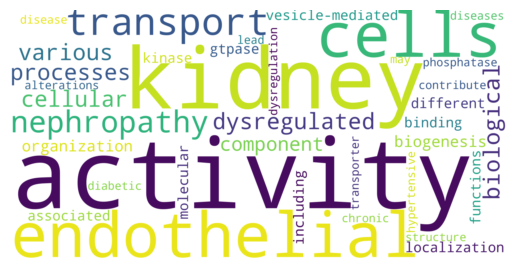

The dysregulated genes in endothelial cells in kidney are involved in various biological processes such as cellular component organization or biogenesis, protein transport, vesicle-mediated transport, protein localization, and protein binding. These genes are also associated with different molecular functions including GTPase activity, protein kinase activity, protein phosphatase activity, and transporter activity. The dysregulation of these genes may lead to alterations in the structure and function of endothelial cells, which can contribute to kidney diseases such as diabetic nephropathy, hypertensive nephropathy, and chronic kidney disease.

EC_COV_AKI_mod_108
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: HPGD, CLK2, ARHGAP31, BTBD7, ESRP2, ACAN, COL2A1, ZEB2, CLDN4, ZBTB17, OXTR, MMP17, I

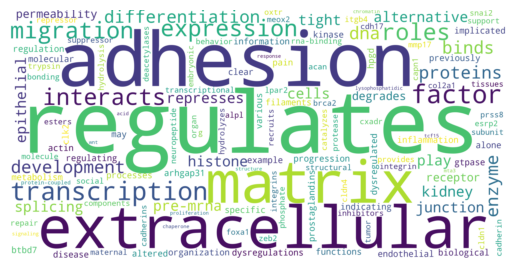

These genes are dysregulated in endothelial cells in kidney, indicating that they may play a role in the development or progression of kidney disease. The specific molecular functions altered by these gene dysregulations are not clear from this information alone. However, some of these genes have been previously implicated in various biological processes such as cell adhesion, extracellular matrix organization, and regulation of gene expression. For example, HPGD is involved in the metabolism of prostaglandins, which play important roles in regulating inflammation and pain. CLK2 is a kinase that regulates alternative splicing of pre-mRNA. ARHGAP31 is a GTPase that interacts with actin filaments and regulates cell adhesion and migration. BTBD7 is a transcriptional repressor that binds to DNA and recruits histone deacetylases. ESRP2 is an RNA-binding protein that regulates alternative splicing of pre-mRNA. ACAN and COL2A1 are components of the extracellular matrix, which provides structu

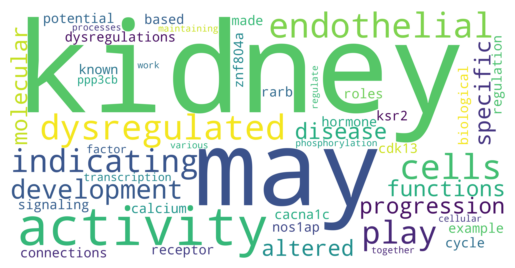

These genes are dysregulated in endothelial cells in kidney, indicating that they may play a role in the development or progression of kidney disease. The specific molecular functions altered by these gene dysregulations are not known, but some potential connections can be made based on their biological roles. For example, CDK13 and KSR2 are involved in cell cycle regulation, CACNA1C and NOS1AP are involved in calcium signaling, RARB is involved in hormone receptor activity, ZNF804A is involved in transcription factor activity, and PPP3CB is involved in protein phosphorylation. These genes may work together to regulate various cellular processes that are important for maintaining kidney function.

EC_COV_AKI_mod_33
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: AFMID, CCNC, MED13, WDR5, ESRRB,

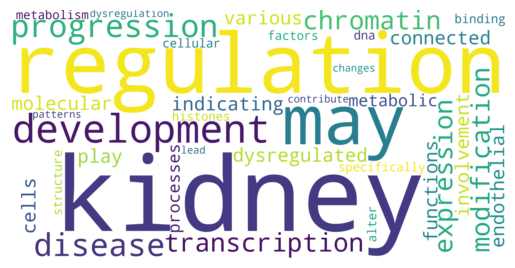

These genes are dysregulated in endothelial cells in kidney, indicating that they may play a role in the development or progression of kidney disease. The genes are connected through their involvement in various molecular functions such as transcription regulation, chromatin modification, and metabolic processes. Specifically, these genes are involved in the regulation of gene expression through the binding of transcription factors to DNA, the modification of histones to alter chromatin structure, and the regulation of cellular metabolism. The dysregulation of these genes may lead to changes in gene expression patterns that contribute to the development or progression of kidney disease.

EC_COV_AKI_mod_120
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: FOXN3, WEE1, STMN1, PAK1, KCNIP2, KCND3, 

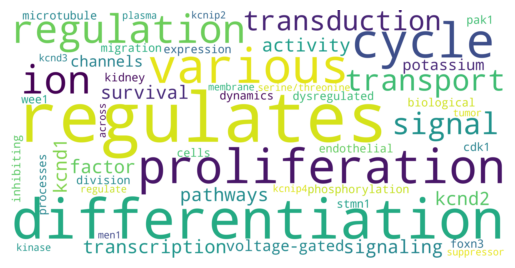

The dysregulated genes in endothelial cells in kidney are involved in various biological processes such as cell cycle regulation, ion transport, signal transduction, and protein phosphorylation. FOXN3 is a transcription factor that regulates the expression of genes involved in cell cycle regulation and differentiation. WEE1 is also a transcription factor that regulates the cell cycle by inhibiting CDK1 activity. STMN1 is a protein that regulates microtubule dynamics, which are important for cell division and migration. PAK1 is a serine/threonine kinase that regulates various signaling pathways involved in cell proliferation, differentiation, and survival. KCNIP2, KCND3, KCND1, and KCND2 are voltage-gated potassium channels that regulate ion transport across the plasma membrane. KCND1 is also involved in signal transduction. KCND2 is involved in cell proliferation and differentiation. KCNIP4 is a protein that regulates the activity of voltage-gated potassium channels. MEN1 is a tumor su

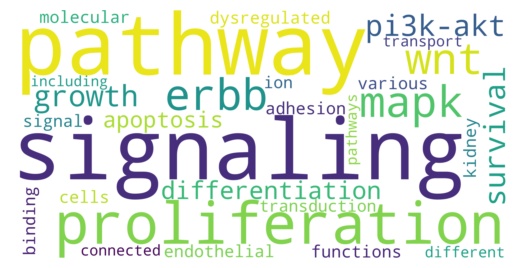

The dysregulated genes in endothelial cells in kidney are involved in various molecular functions such as cell adhesion, signal transduction, protein binding, and ion transport. These genes are connected through different pathways including the ErbB signaling pathway, Wnt signaling pathway, MAPK signaling pathway, and PI3K-Akt signaling pathway. The ErbB signaling pathway is involved in cell growth, proliferation, and survival. The Wnt signaling pathway is involved in cell differentiation, proliferation, and apoptosis. The MAPK signaling pathway is involved in cell proliferation, differentiation, and apoptosis. The PI3K-Akt signaling pathway is involved in cell growth, proliferation, and survival.

EC_H_CKD_mod_14
Use the following pieces of information to answer the user's question.
If you don't know the answer, just say that you don't know, don't try to make up an answer.

Question: The following genes are dysregulated in endothelial cells in kidney: PDZK1, LTB, KCNJ15, ITSN1, CLCNKB

In [ ]:
context = "endothelial cells in kidney"
for modname in spec_mods:
    print(modname)
    
    res=aid.query_genelist(tlda.communities[modname], context, verbose=True, word_cloud=True)
    plt.show()
    plt.close()
    
    print(res)
    print()

6 3 18 16


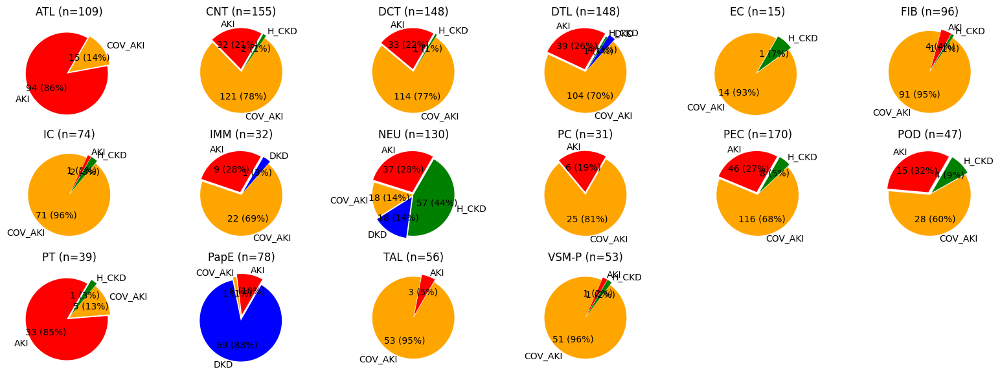

In [6]:
dcolors = {"AKI": "red", "COV_AKI": "orange", "H_CKD": "green", "DKD": "blue"}

tlda.plot_module_description(nrow=3, figsize=(20,7), dcolors=dcolors)
plt.savefig("kpmp_community_overview.png")

In [19]:
kg

KGraph KGraph with 111032 nodes and 1617389 edges

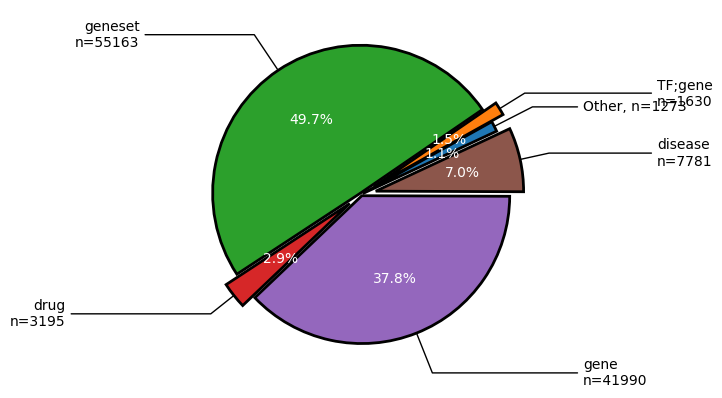

In [22]:
kg.plot_node_types(show_threshold=0.01)

In [52]:
len(all_modalities) //3

5

/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/extproj/projekte/bartelt/software/miniconda3/envs/regnetworks/lib/python3.11/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning

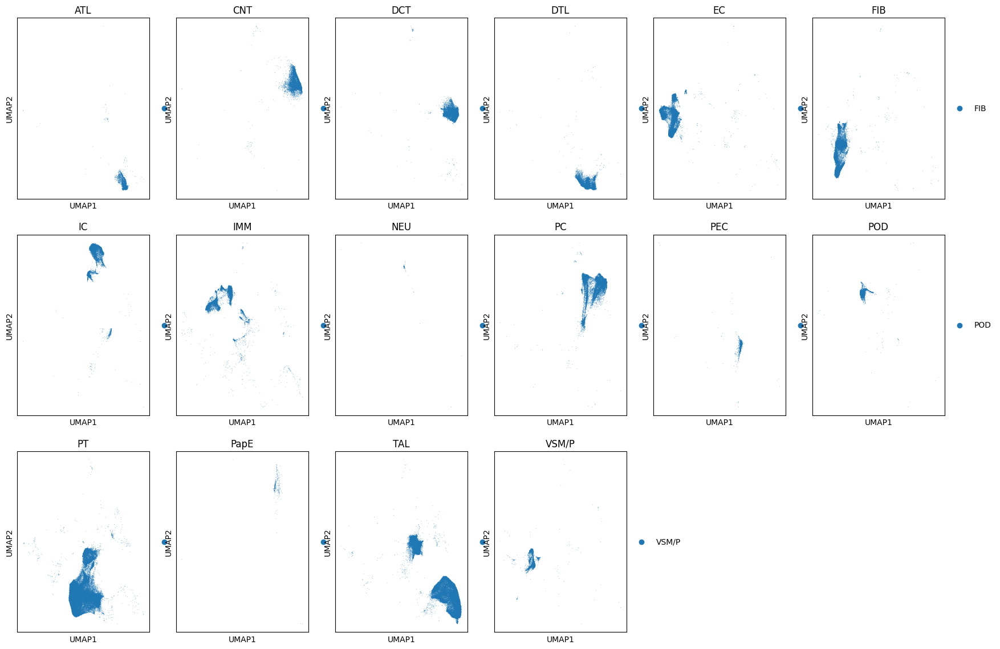

In [58]:
import matplotlib.pyplot as plt
all_modalities = set(adata.obs[celltype_col])

fig, axs = plt.subplots(3,int(np.ceil(len(all_modalities) / 3)), figsize=(21, 14))
faxs = axs.flatten()

for gi, group in enumerate(sorted(all_modalities)):
    sc.pl.umap(adata[adata.obs[celltype_col] == group], color=celltype_col, ax=faxs[gi], show=False, size=1)
    faxs[gi].set_title(group)

for i in range(gi+1, len(faxs)):
    faxs[i].set_visible(False)


In [98]:
adata.obs[adata.obs[celltype_col] == "DTL"]["mycelltypes"]

index
KB1_AAACGCTGTGGTTCTA         kidney loop of Henle thin descending limb epit...
KB1_AAAGGGCCACACACGC         kidney loop of Henle thin descending limb epit...
KB1_AAAGGGCTCGCATTGA         kidney loop of Henle thin descending limb epit...
KB1_AAAGGTAAGCACACAG         kidney loop of Henle thin descending limb epit...
KB1_AAATGGACAGTGGTGA         kidney loop of Henle thin descending limb epit...
                                                   ...                        
KBCVD4_TATTGCTCATCGTCCT-1    kidney loop of Henle thin descending limb epit...
KBCVD4_TATTGGGAGCTTCATG-1    kidney loop of Henle thin descending limb epit...
KBCVD4_TCAAGCAAGTGGATTA-1    kidney loop of Henle thin descending limb epit...
KBCVD4_TCACGGGTCTCACCCA-1    kidney loop of Henle thin descending limb epit...
KBCVD4_TGAGCATAGAGGCCAT-1    kidney loop of Henle thin descending limb epit...
Name: mycelltypes, Length: 7968, dtype: category
Categories (26, object): ['endothelial cell', 'podocyte', 'epithelial cell o

In [90]:
ukg = kg.kg.to_undirected()

In [ ]:
for gene in ["SCARA5", "COL1A1", "POSTN", "FN1", "RUNX2", "MEOX1", "TEAD4", "COL1A1", "NFATC4", "STAT3", "HSF2", "RELA", "BACH1", "GLI2", "RELB", "TEAD1", "TGFB1", "TBX20", "KLF2", "KLF4", "ATF4", "SP2", "SP3", "FOXP2", "MEF2C", "ETV6", "NFIA"]:
#for gene in ["TWIST2", "LHX9", "MKX", "PRRX1", "PRRX2", "MSX1", "TWIST1", "OSR1", "CITED2", "RUNX1T1", "FOXD1", "TBX3", "NFIX", "HOXB5", "HOXC8", "MEIS2", "HOXC6", "HOXC4"]:
#for gene in ["HIF1A"]:
    targetNodes = [x for x in nx.ego_graph(kg.kg, gene, radius=1, center=True, undirected=False, distance=None).nodes]

    hasDrug = False
    hasDisease = False
    hasGeneset = False

    for node in targetNodes:
        ntypes = kg.node_types(node)
        if "drug" in ntypes:
            hasDrug = True
        if "disease" in ntypes:
            hasDisease = True
        if "geneset" in ntypes:
            hasGeneset = True

    
    print(gene, len(targetNodes), hasDrug , hasDisease , hasGeneset)
    #if len(targetNodes) < 200:
    #    targetKG = kg.subset_kg(targetNodes)
    #    _=targetKG.plot_graph(figsize=(10,10))

In [ ]:
targetNodes = [x for x in nx.ego_graph(kg.kg, "BACH1", radius=1, center=True, undirected=False, distance=None).nodes]
print(len(targetNodes))
targetKG = kg.subset_kg(targetNodes)
_=targetKG.plot_graph(figsize=(10,10))

In [15]:
kg.kg.nodes["NRG3"]

{'type': {'gene'}, 'source': 'STRING', 'name': 'NRG3', 'score': 0}

In [12]:
kg.kg.edges[('NFAT5', 'LTB')]

{'type': 'activates',
 'source': 'omnipath',
 'omnipath_evidences': ['CollecTRI:11485737', 'DoRothEA:11485737'],
 'omnipath_type': 'transcriptional'}

In [17]:
kg.kg.in_edges("NRG3")

InEdgeDataView([('MAPK1', 'NRG3'), ('CDC37', 'NRG3'), ('PTPN12', 'NRG3'), ('KRAS', 'NRG3'), ('MAPK3', 'NRG3'), ('ERBB3', 'NRG3'), ('EGFR', 'NRG3'), ('PRKCB', 'NRG3'), ('ADAM17', 'NRG3'), ('PSEN1', 'NRG3'), ('HSP90AA1', 'NRG3'), ('ERBB4', 'NRG3'), ('AUTS2', 'NRG3'), ('NRG2', 'NRG3'), ('NRAS', 'NRG3'), ('NRG4', 'NRG3'), ('NRG1', 'NRG3'), ('CADPS2', 'NRG3'), ('HRAS', 'NRG3'), ('PRKCA', 'NRG3'), ('ERBB2IP', 'NRG3'), ('YES1', 'NRG3'), ('FOXA1', 'NRG3'), ('GATA2', 'NRG3'), ('MITF', 'NRG3'), ('AR', 'NRG3'), ('FOXP3', 'NRG3')])

In [32]:
mc = ModuleCompare()

In [78]:
allSigKG = dict(tlda.cellgroupdata["EC"]["communities_enhanced"], **tlda.cellgroupdata["FIB"]["communities_enhanced"],)

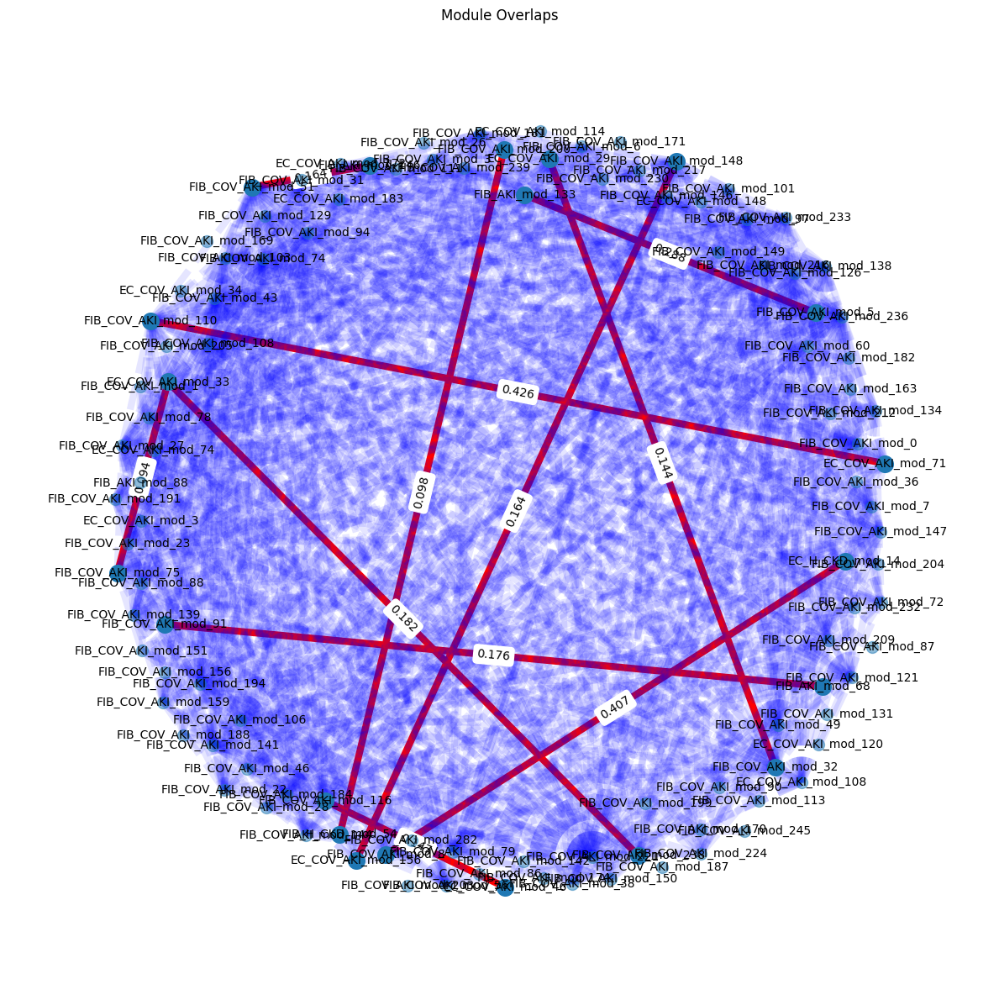

In [81]:
jaccardSims = mc.network_compare_modules(allSigKG, measure="jaccard", borderWeightQuantile=0.99)

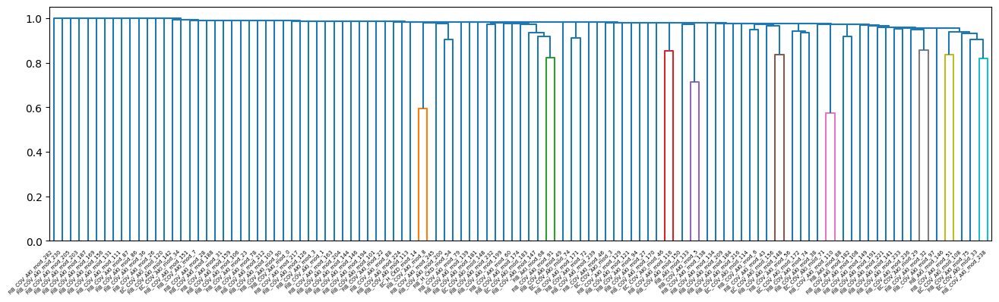

In [82]:
mc.plot_dendrogram(jaccardSims, figsize=(16, 4), color_threshold=0.9)

In [83]:
ns = NETSIM(kg)

|#########################################################| 100% Time:  1:23:5213


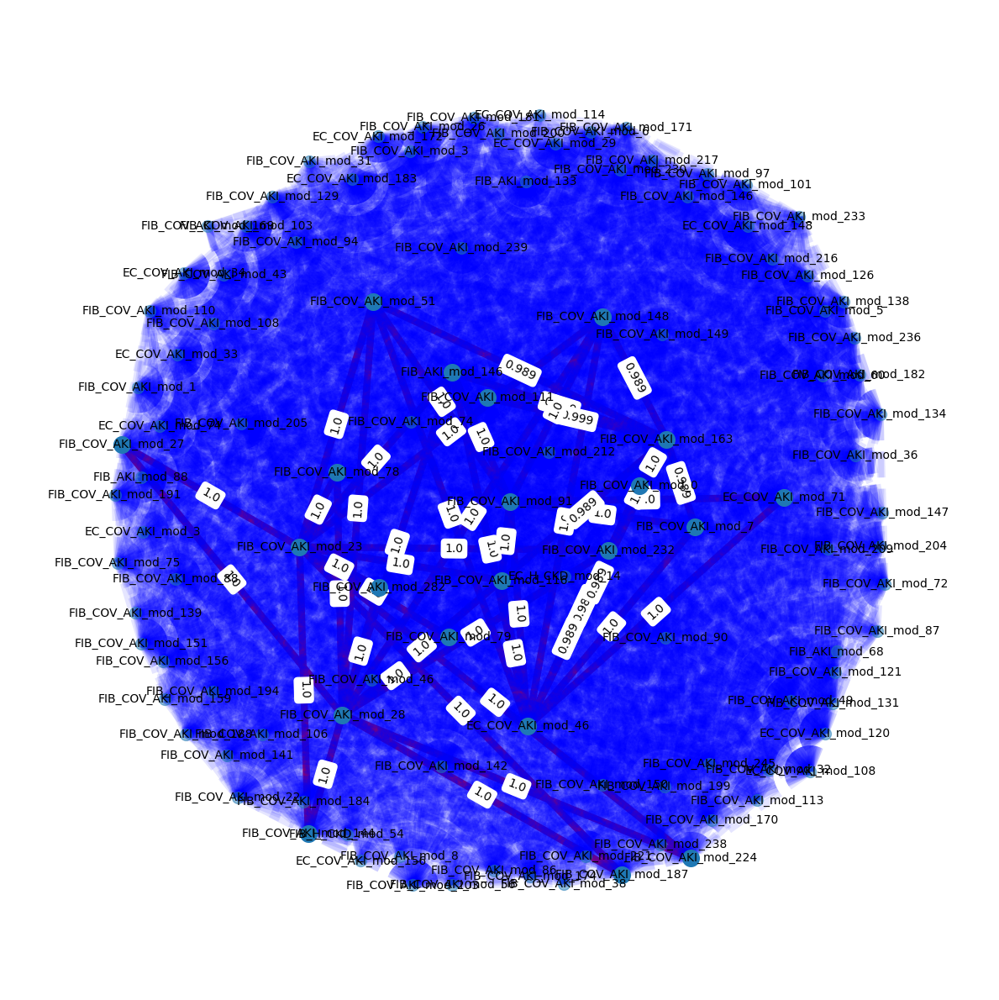

In [95]:
modNetSims_all = mc.network_compare_netsim(allSigKG, ns=ns, max_terms=2, borderWeightQuantile=0.99)

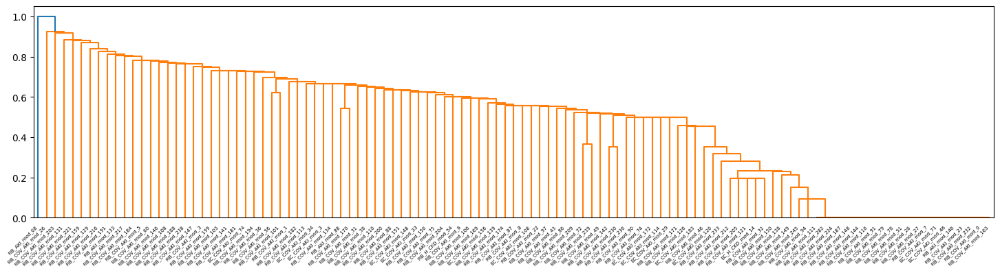

In [96]:
mc.plot_dendrogram(modNetSims_all, figsize=(18,4))

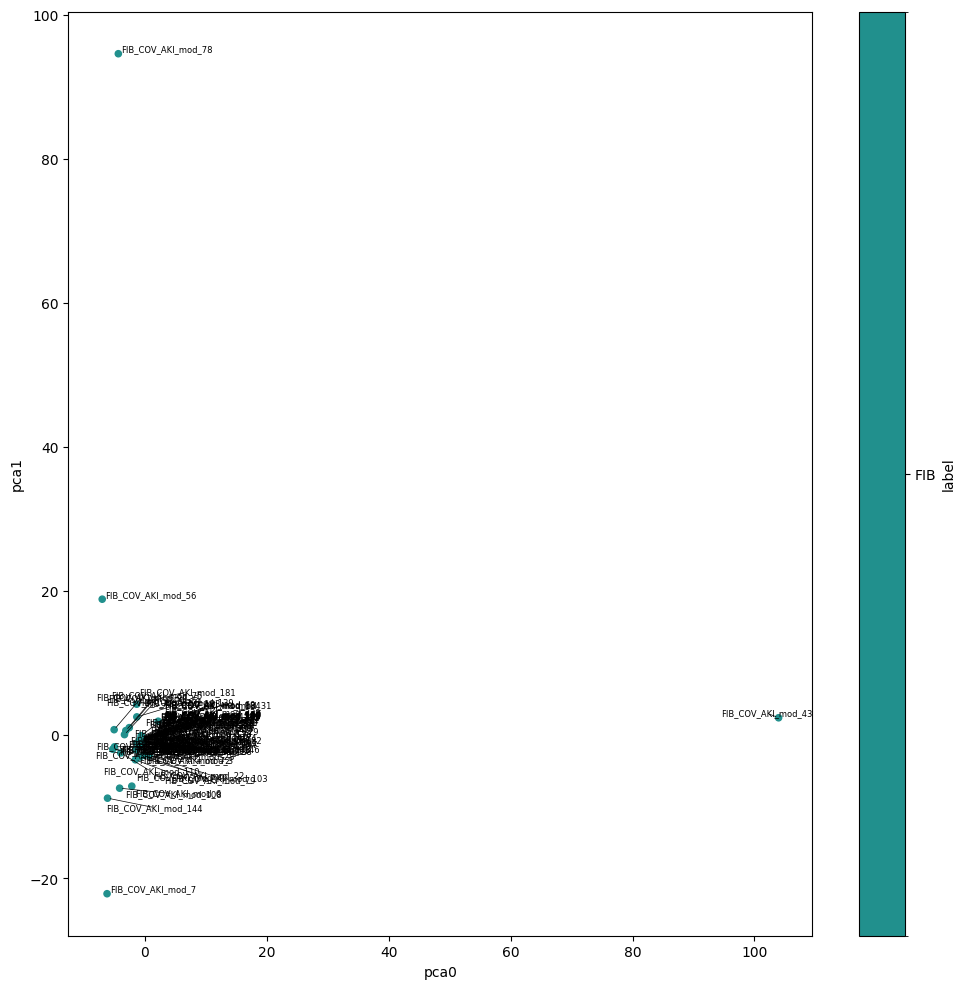

In [97]:
emb = mc.module_pca(fibKGs, kg)

In [ ]:
%%capture captured_plot_module_comparisons
tlda.plot_module_comparisons(plot_communities=True)

In [ ]:
captured_plot_module_comparisons()